In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [ ]:
!pip install torch-fidelity 


In [1]:
import os
from PIL import Image, ImageEnhance
from torchvision import transforms
from tqdm import tqdm

# Paths
input_dir = "/kaggle/input/stare-dataset"
output_base = "/kaggle/working/stare_prepared"

# Output folders
resize_dir = os.path.join(output_base, "resized")
augment_dir = os.path.join(output_base, "augmented")
enhance_dir = os.path.join(output_base, "enhanced")

# Create directories
os.makedirs(resize_dir, exist_ok=True)
os.makedirs(augment_dir, exist_ok=True)
os.makedirs(enhance_dir, exist_ok=True)

resize_size = (256, 256)

# Data augmentation
augmentations = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(20),
    transforms.RandomVerticalFlip()
])

# Enhancement function
def enhance_image(img):
    img = ImageEnhance.Contrast(img).enhance(1.5)
    img = ImageEnhance.Sharpness(img).enhance(2.0)
    img = ImageEnhance.Color(img).enhance(1.3)
    return img

# Iterate and save images
for filename in tqdm(os.listdir(input_dir)):
    if filename.endswith(".ppm"):
        img_path = os.path.join(input_dir, filename)
        image = Image.open(img_path).convert("RGB")
        resized = image.resize(resize_size)

        base_filename = os.path.splitext(filename)[0]

        # Save resized image as PNG
        #resized.save(f"{resize_dir}/{base_filename}.png")

        # Save augmented images
        for i in range(2):
            augmented = augmentations(resized)
            augmented.save(f"{augment_dir}/{base_filename}_aug{i}.png")
        resized.save(f"{augment_dir}/{base_filename}.png")
            

        # Save enhanced image
        #enhanced = enhance_image(resized)
        #enhanced.save(f"{enhance_dir}/{base_filename}_enhanced.png")


100%|██████████| 397/397 [00:54<00:00,  7.29it/s]


In [2]:
import os
len(os.listdir("/kaggle/working/stare_prepared/augmented"))

1191

In [ ]:
'''from diffusers import DDPMScheduler, UNet2DModel
from torchvision import transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image
import torch
import matplotlib.pyplot as plt
import os
from torch import amp
from tqdm import tqdm  # <-- Added tqdm
from torchmetrics.image.fid import FrechetInceptionDistance
from torch.utils.data import random_split
from torchmetrics.image.kid import KernelInceptionDistance
from torchmetrics.image.ssim import StructuralSimilarityIndexMeasure
from torchmetrics.image.psnr import PeakSignalNoiseRatio
from torchmetrics.image.lpip import LearnedPerceptualImagePatchSimilarity
from torchmetrics.image.inception import InceptionScore


class ImageFolderDataset(Dataset):
    def __init__(self, folder_path, image_size=256):
        self.image_paths = [os.path.join(folder_path, f) for f in os.listdir(folder_path) if f.endswith('.png')]
        self.transform = transforms.Compose([
            transforms.Resize((image_size, image_size)),
            transforms.ToTensor(),
            transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
        ])

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image = Image.open(self.image_paths[idx]).convert("RGB")
        return self.transform(image)

def train_diffusion_model(data_path, model_name="model_aug", epochs=25, batch_size=1, resume_from=None):
    dataset = ImageFolderDataset(data_path)
    val_size = int(0.01 * len(dataset))
    train_size = len(dataset) - val_size
    train_dataset, val_dataset = random_split(dataset, [train_size, val_size])
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False)

    model = UNet2DModel(
        sample_size=256,
        in_channels=3,
        out_channels=3,
        layers_per_block=2,
        block_out_channels=(64, 128, 256),
        down_block_types=("DownBlock2D", "DownBlock2D", "AttnDownBlock2D"),
        up_block_types=("AttnUpBlock2D", "UpBlock2D", "UpBlock2D")
    )

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"{device} is currently being used")
    model = model.to(device)

    if resume_from and os.path.exists(resume_from):
        print(f"Loading weights from: {resume_from}")
        model.load_state_dict(torch.load(resume_from, map_location=device))
    
    fid_metric = FrechetInceptionDistance(feature=2048).to(device)
    fid_metric = FrechetInceptionDistance(feature=2048).to(device)
    kid_metric = KernelInceptionDistance(subset_size=50).to(device)
    ssim_metric = StructuralSimilarityIndexMeasure(data_range=1.0).to(device)
    psnr_metric = PeakSignalNoiseRatio(data_range=1.0).to(device)
    lpips_metric = LearnedPerceptualImagePatchSimilarity(net_type='vgg').to(device)
    inception_metric = InceptionScore().to(device)


    noise_scheduler = DDPMScheduler(num_train_timesteps=1000)
    optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4)

    losses = []
    fid_scores = []
    kid_scores = []
    ssim_scores = []
    psnr_scores = []
    lpips_scores = []
    inception_scores = []
    diversity_scores = []

    scaler = amp.GradScaler(device="cuda")

    for epoch in range(epochs):
        model.train()
        total_loss = 0
        print(f"\nEpoch {epoch+1}/{epochs}")
        for batch in tqdm(train_loader, desc=f"Training {model_name}"):
            clean_images = batch.to(device)
            noise = torch.randn_like(clean_images)
            timesteps = torch.randint(0, noise_scheduler.config.num_train_timesteps, (clean_images.shape[0],), device=device).long()
            noisy_images = noise_scheduler.add_noise(clean_images, noise, timesteps)

            with amp.autocast(device_type="cuda"):
                output = model(noisy_images, timesteps)
                pred_noise = output.sample if hasattr(output, "sample") else output
                loss = torch.nn.functional.mse_loss(pred_noise, noise)

            optimizer.zero_grad()
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()
            total_loss += loss.item()

        avg_loss = total_loss / len(train_loader)
        losses.append(avg_loss)
        print(f"[{model_name}] Epoch {epoch+1}, Loss: {avg_loss:.4f}")

        # ================== VALIDATION FID ==================
        model.eval()
        generated = generate_samples(model, noise_scheduler, num_images=len(val_dataset), image_size=256, return_tensor=True)
        
        

        fid_metric.reset()
        for img in tqdm(generated, desc="FID - Generated"):
            fid_metric.update(img.unsqueeze(0).to(device), real=False)
        for real_img in tqdm(val_dataset, desc="FID - Real"):
            real_img = (real_img * 0.5 + 0.5).clamp(0, 1)  # [0, 1]
            real_img = (real_img * 255).to(torch.uint8)
            fid_metric.update(real_img.unsqueeze(0).to(device), real=True)
        
        fid_score = fid_metric.compute().item()
        fid_scores.append(fid_score)
        # Assuming 'generated' and 'real_images' are tensors of shape (N, 3, H, W) with values in [0, 1]
        fid_metric.update(generated, real=False)
        fid_metric.update(real_images, real=True)
        fid_score = fid_metric.compute().item()
        fid_scores.append(fid_score)
        fid_metric.reset()
        
        kid_metric.update(generated, real=False)
        kid_metric.update(real_images, real=True)
        kid_score = kid_metric.compute().item()
        kid_scores.append(kid_score)
        kid_metric.reset()
        
        ssim_score = ssim_metric(generated, real_images).item()
        ssim_scores.append(ssim_score)
        
        psnr_score = psnr_metric(generated, real_images).item()
        psnr_scores.append(psnr_score)
        
        lpips_score = lpips_metric(generated, real_images).item()
        lpips_scores.append(lpips_score)
        
        inception_score = inception_metric(generated)[0].item()
        inception_scores.append(inception_score)
        
        # Diversity Score: Compute the average pairwise LPIPS between generated images
        diversity = 0.0
        count = 0
        for i in range(len(generated)):
            for j in range(i + 1, len(generated)):
                diversity += lpips_metric(generated[i].unsqueeze(0), generated[j].unsqueeze(0)).item()
                count += 1
        diversity_score = diversity / count if count > 0 else 0
        diversity_scores.append(diversity_score)

        print(f"[{model_name}] Epoch {epoch+1}, FID Score: {fid_score:.4f}")

        # Show first 4 generated samples
        grid = torch.cat(generated[:4], dim=2).permute(1, 2, 0).cpu().numpy()
        plt.imshow(grid)
        plt.title(f"Generated Samples - {model_name} Epoch {epoch+1}")
        plt.axis("off")
        plt.show()

        torch.save(model.state_dict(), f"/kaggle/working/{model_name}_checkpoint_{epoch+1}.pth")


    # ================== Save Loss Plot ==================
    loss_plot_path = f"/kaggle/working/{model_name}_loss.png"
    plt.plot(losses, label=model_name)
    plt.title(f"Training Loss - {model_name}")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.savefig(loss_plot_path)
    plt.show()
    plt.close()

    fid_plot_path = f"/kaggle/working/{model_name}_fid.png"
    plt.plot(fid_scores, label="Validation FID", color='orange')
    plt.title(f"Validation FID - {model_name}")
    plt.xlabel("Epochs")
    plt.ylabel("FID Score")
    plt.legend()
    plt.savefig(fid_plot_path)
    plt.show()
    plt.close()

    # Save model weights
    torch.save(model.state_dict(), f"/kaggle/working/{model_name}_weights.pth")

    return model, losses, fid_scores'''



In [ ]:
'''from diffusers import DDPMScheduler, UNet2DModel
from torchvision import transforms
from torch.utils.data import DataLoader, Dataset, random_split
from PIL import Image
import torch
import matplotlib.pyplot as plt
import os
from torch import amp
from tqdm import tqdm
from torchmetrics.image.fid import FrechetInceptionDistance
from torchmetrics.image.kid import KernelInceptionDistance
from torchmetrics.image.ssim import StructuralSimilarityIndexMeasure
from torchmetrics.image.psnr import PeakSignalNoiseRatio
from torchmetrics.image.lpip import LearnedPerceptualImagePatchSimilarity
from torchmetrics.image.inception import InceptionScore


class ImageFolderDataset(Dataset):
    def __init__(self, folder_path, image_size=256):
        self.image_paths = [os.path.join(folder_path, f) for f in os.listdir(folder_path) if f.endswith('.png')]
        self.transform = transforms.Compose([
            transforms.Resize((image_size, image_size)),
            transforms.ToTensor(),
            transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
        ])

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image = Image.open(self.image_paths[idx]).convert("RGB")
        return self.transform(image)


def generate_samples(model, noise_scheduler, num_images=8, image_size=256, return_tensor=True):
    model.eval()
    device = next(model.parameters()).device
    samples = []
    for _ in range(num_images):
        x = torch.randn(1, 3, image_size, image_size).to(device)
        for t in reversed(range(noise_scheduler.config.num_train_timesteps)):
            t_tensor = torch.tensor([t], device=device)
            with torch.no_grad():
                out = model(x, t_tensor)
                pred_noise = out.sample if hasattr(out, "sample") else out
            x = noise_scheduler.step(pred_noise, t_tensor, x).prev_sample
        samples.append(((x.squeeze(0) * 0.5 + 0.5).clamp(0, 1)).cpu())
    return torch.stack(samples) if return_tensor else samples


def train_diffusion_model(data_path, model_name="model_aug", epochs=25, batch_size=1, resume_from=None):
    dataset = ImageFolderDataset(data_path)
    val_size = int(0.007 * len(dataset))
    train_size = len(dataset) - val_size
    train_dataset, val_dataset = random_split(dataset, [train_size, val_size])
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False)

    model = UNet2DModel(
        sample_size=256,
        in_channels=3,
        out_channels=3,
        layers_per_block=2,
        block_out_channels=(64, 128, 256),
        down_block_types=("DownBlock2D", "DownBlock2D", "AttnDownBlock2D"),
        up_block_types=("AttnUpBlock2D", "UpBlock2D", "UpBlock2D")
    )

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"{device} is currently being used")
    model = model.to(device)

    if resume_from and os.path.exists(resume_from):
        print(f"Loading weights from: {resume_from}")
        model.load_state_dict(torch.load(resume_from, map_location=device))

    fid_metric = FrechetInceptionDistance(feature=2048).to(device)
    kid_metric = KernelInceptionDistance(subset_size=5).to(device)
    ssim_metric = StructuralSimilarityIndexMeasure(data_range=1.0).to(device)
    psnr_metric = PeakSignalNoiseRatio(data_range=1.0).to(device)
    lpips_metric = LearnedPerceptualImagePatchSimilarity(net_type='vgg').to(device)
    inception_metric = InceptionScore().to(device)

    noise_scheduler = DDPMScheduler(num_train_timesteps=1000)
    optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4)

    losses, fid_scores, kid_scores, ssim_scores = [], [], [], []
    psnr_scores, lpips_scores, inception_scores, diversity_scores = [], [], [], []

    scaler = amp.GradScaler(device="cuda")

    for epoch in range(epochs):
        model.train()
        total_loss = 0
        print(f"\\nEpoch {epoch+1}/{epochs}")
        for batch in tqdm(train_loader, desc=f"Training {model_name}"):
            clean_images = batch.to(device)
            noise = torch.randn_like(clean_images)
            timesteps = torch.randint(0, noise_scheduler.config.num_train_timesteps, (clean_images.shape[0],), device=device).long()
            noisy_images = noise_scheduler.add_noise(clean_images, noise, timesteps)

            with amp.autocast(device_type="cuda"):
                output = model(noisy_images, timesteps)
                pred_noise = output.sample if hasattr(output, "sample") else output
                loss = torch.nn.functional.mse_loss(pred_noise, noise)

            optimizer.zero_grad()
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()
            total_loss += loss.item()

        avg_loss = total_loss / len(train_loader)
        losses.append(avg_loss)
        print(f"[{model_name}] Epoch {epoch+1}, Loss: {avg_loss:.4f}")

        model.eval()
        generated = generate_samples(model, noise_scheduler, num_images=len(val_dataset), image_size=256, return_tensor=True)
        real_images = torch.stack([val_dataset[i] for i in range(len(val_dataset))]).to(device)

        # Normalize back to [0, 1] if needed
        generated = generated.to(device)

        fid_metric.reset()
        # Convert to [0, 255] range and uint8
        generated_uint8 = (generated * 255).clamp(0, 255).to(torch.uint8)
        real_images_uint8 = ((real_images * 255).clamp(0, 255)).to(torch.uint8)

        # Ensure inputs are float and in [0, 1] range if required
        generated_f = generated.float() / 255.0 if generated.dtype == torch.uint8 else generated
        real_images_f = real_images.float() / 255.0 if real_images.dtype == torch.uint8 else real_images
        
        
        fid_metric.update(generated_uint8, real=False)
        fid_metric.update(real_images_uint8, real=True)

        fid_score = fid_metric.compute().item()
        fid_scores.append(fid_score)

        kid_metric.reset()
        kid_metric.update(generated_uint8, real=False)
        kid_metric.update(real_images_uint8, real=True)
        kid_mean, kid_std = kid_metric.compute()
        kid_score = kid_mean.item()

        kid_scores.append(kid_score)

        ssim_score = ssim_metric(generated_f, real_images_f).item()
        ssim_scores.append(ssim_score)

        psnr_score = psnr_metric(generated_f, real_images_f).item()
        psnr_scores.append(psnr_score)


        # Convert to range [-1, 1] for LPIPS
        generated_lp = generated.to(torch.float32) / 255.0 * 2 - 1
        real_images_lp = real_images.to(torch.float32)
        
        # Normalize real_images if needed
        if real_images_lp.max() > 1.5 or real_images_lp.min() < -1.5:
            real_images_lp = real_images_lp / 255.0 * 2 - 1
        
        generated_lp = generated_lp.to(device)
        real_images_lp = real_images_lp.to(device)
        
        lpips_score = lpips_metric(generated_lp, real_images_lp).item()
        lpips_scores.append(lpips_score)

        inception_score = inception_metric(generated)[0].item()
        inception_scores.append(inception_score)

        # Diversity Score
        diversity = 0.0
        count = 0
        for i in range(len(generated)):
            for j in range(i + 1, len(generated)):
                diversity += lpips_metric(generated[i].unsqueeze(0), generated[j].unsqueeze(0)).item()
                count += 1
        diversity_score = diversity / count if count > 0 else 0
        diversity_scores.append(diversity_score)

        print(f"[{model_name}] Epoch {epoch+1}, FID Score: {fid_score:.4f}, KID: {kid_score:.4f}, SSIM: {ssim_score}, PSNR: {psnr_score}, lpips: {lpips_score}, Inception: {inception_score}, Diversity: {diversity_score}")

        torch.save(model.state_dict(), f"/kaggle/working/{model_name}_checkpoint_{epoch+1}.pth")

    # Save plots
    def save_plot(data, title, ylabel, filename):
        plt.plot(data)
        plt.title(title)
        plt.xlabel("Epochs")
        plt.ylabel(ylabel)
        plt.savefig(filename)
        plt.show()
        plt.close()

    save_plot(losses, f"Training Loss - {model_name}", "Loss", f"/kaggle/working/{model_name}_loss.png")
    save_plot(fid_scores, f"Validation FID - {model_name}", "FID Score", f"/kaggle/working/{model_name}_fid.png")

    torch.save(model.state_dict(), f"/kaggle/working/{model_name}_weights.pth")

    return model, losses, fid_scores, kid_scores, ssim_scores, psnr_scores, lpips_scores, inception_scores, diversity_scores
    '''

In [3]:
def generate_samples(model, noise_scheduler, num_images=4, image_size=256, model_name="model", return_tensor=False):
    import torch
    import matplotlib.pyplot as plt
    import numpy as np
    from torch import amp
    from tqdm import tqdm

    device = next(model.parameters()).device
    model.eval()

    samples = torch.randn((num_images, 3, image_size, image_size)).to(device)

    for t in tqdm(reversed(range(noise_scheduler.config.num_train_timesteps)), desc="Sampling"):
        timesteps = torch.full((num_images,), t, device=device, dtype=torch.long)
        with torch.no_grad():
            with amp.autocast(device_type="cuda"):
                output = model(samples, timesteps)
                pred_noise = output.sample if hasattr(output, "sample") else output

        samples = noise_scheduler.step(pred_noise, t, samples).prev_sample

    # De-normalize and convert to uint8
    samples = (samples.clamp(-1, 1) + 1) / 2  # [0, 1]
    samples = (samples * 255).to(torch.uint8)  # [0, 255] uint8
    samples = samples.detach().cpu()
    ret_sam = samples


      # For FID use

    # Visualization
    grid_cols = min(num_images, 4)
    grid_rows = (num_images + grid_cols - 1) // grid_cols
    fig, axs = plt.subplots(grid_rows, grid_cols, figsize=(grid_cols * 3, grid_rows * 3))

    axs = axs.flatten() if isinstance(axs, np.ndarray) else [axs]

    for i in range(num_images):
        img = samples[i].permute(1, 2, 0).numpy()
        axs[i].imshow(img)
        axs[i].axis('off')

    for j in range(num_images, len(axs)):
        axs[j].axis('off')

    plt.tight_layout()
    plt.savefig(f"/kaggle/working/{model_name}_samples.png")
    plt.show()

    if return_tensor:
        return ret_sam


In [4]:
from diffusers import DDPMScheduler, UNet2DModel
from torchvision import transforms
from torch.utils.data import DataLoader, Dataset, random_split
from PIL import Image
import torch
import matplotlib.pyplot as plt
import os
from torch import amp
from tqdm import tqdm
from torchmetrics.image.fid import FrechetInceptionDistance
from torchmetrics.image.kid import KernelInceptionDistance
from torchmetrics.image.ssim import StructuralSimilarityIndexMeasure
from torchmetrics.image.psnr import PeakSignalNoiseRatio
from torchmetrics.image.lpip import LearnedPerceptualImagePatchSimilarity
from torchmetrics.image.inception import InceptionScore


class ImageFolderDataset(Dataset):
    def __init__(self, folder_path, image_size=256):
        self.image_paths = [os.path.join(folder_path, f) for f in os.listdir(folder_path) if f.endswith('.png')]
        self.transform = transforms.Compose([
            transforms.Resize((image_size, image_size)),
            transforms.ToTensor(),
            transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
        ])

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image = Image.open(self.image_paths[idx]).convert("RGB")
        return self.transform(image)


'''def generate_samples(model, noise_scheduler, num_images=8, image_size=256, return_tensor=True):
    model.eval()
    device = next(model.parameters()).device
    samples = []
    for _ in range(num_images):
        x = torch.randn(1, 3, image_size, image_size).to(device)
        for t in reversed(range(noise_scheduler.config.num_train_timesteps)):
            t_tensor = torch.tensor([t], device=device)
            with torch.no_grad():
                out = model(x, t_tensor)
                pred_noise = out.sample if hasattr(out, "sample") else out
            x = noise_scheduler.step(pred_noise, t_tensor, x).prev_sample
        samples.append(((x.squeeze(0) * 0.5 + 0.5).clamp(0, 1)).cpu())
    return torch.stack(samples) if return_tensor else samples'''
# Denormalize from [-1, 1] to [0, 255] and convert to uint8
def denormalize_to_uint8(img):
    img = (img * 0.5 + 0.5)  # Convert from [-1,1] to [0,1]
    img = img.clamp(0, 1) * 255
    return img.to(torch.uint8)

def denormalize_to_float(img):
    img = (img * 0.5 + 0.5).clamp(0, 1)  # Stays in float format
    return img



def train_diffusion_model(data_path, model_name="model_aug", epochs=25, batch_size=1, resume_from=None):
    dataset = ImageFolderDataset(data_path)
    val_size = int(0.007 * len(dataset))
    train_size = len(dataset) - val_size
    train_dataset, val_dataset = random_split(dataset, [train_size, val_size])
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False)

    model = UNet2DModel(
        sample_size=256,
        in_channels=3,
        out_channels=3,
        layers_per_block=2,
        block_out_channels=(64, 128, 256),
        down_block_types=("DownBlock2D", "DownBlock2D", "AttnDownBlock2D"),
        up_block_types=("AttnUpBlock2D", "UpBlock2D", "UpBlock2D")
    )

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"{device} is currently being used")
    model = model.to(device)

    if resume_from and os.path.exists(resume_from):
        print(f"Loading weights from: {resume_from}")
        model.load_state_dict(torch.load(resume_from, map_location=device))

    fid_metric = FrechetInceptionDistance(feature=2048).to(device)
    kid_metric = KernelInceptionDistance(subset_size=5).to(device)
    ssim_metric = StructuralSimilarityIndexMeasure(data_range=1.0).to(device)
    psnr_metric = PeakSignalNoiseRatio(data_range=1.0).to(device)
    lpips_metric = LearnedPerceptualImagePatchSimilarity(net_type='vgg').to(device)
    inception_metric = InceptionScore().to(device)

    noise_scheduler = DDPMScheduler(num_train_timesteps=1000)
    optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4)

    losses, fid_scores, kid_scores, ssim_scores = [], [], [], []
    psnr_scores, lpips_scores, inception_scores, diversity_scores = [], [], [], []

    scaler = amp.GradScaler(device="cuda")

    for epoch in range(epochs):
        model.train()
        total_loss = 0
        print(f"\nEpoch {epoch+1}/{epochs}")
        for batch in tqdm(train_loader, desc=f"Training {model_name}"):
            clean_images = batch.to(device)
            noise = torch.randn_like(clean_images)
            timesteps = torch.randint(0, noise_scheduler.config.num_train_timesteps, (clean_images.shape[0],), device=device).long()
            noisy_images = noise_scheduler.add_noise(clean_images, noise, timesteps)

            with amp.autocast(device_type="cuda"):
                output = model(noisy_images, timesteps)
                pred_noise = output.sample if hasattr(output, "sample") else output
                loss = torch.nn.functional.mse_loss(pred_noise, noise)

            optimizer.zero_grad()
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()
            total_loss += loss.item()

        avg_loss = total_loss / len(train_loader)
        losses.append(avg_loss)
        print(f"[{model_name}] Epoch {epoch+1}, Loss: {avg_loss:.4f}")

        model.eval()
        generated = generate_samples(model, noise_scheduler, num_images=len(val_dataset), image_size=256, return_tensor=True).to(device)
        real_images = torch.stack([val_dataset[i] for i in range(len(val_dataset))]).to(device)

        # --- Normalize inputs for metrics ---
        generated_f = denormalize_to_uint8(generated)
        real_images_f = denormalize_to_uint8(real_images)

        # FID / KID
        fid_metric.reset()
        fid_metric.update(generated_f, real=False)
        fid_metric.update(real_images_f, real=True)
        fid_scores.append(fid_metric.compute().item())

        kid_metric.reset()
        kid_metric.update(generated_f, real=False)
        kid_metric.update(real_images_f, real=True)
        kid_mean, _ = kid_metric.compute()
        kid_scores.append(kid_mean.item())

        generated_fl = denormalize_to_float(generated)
        real_images_fl = denormalize_to_float(real_images)


        # SSIM / PSNR
        ssim_scores.append(ssim_metric(generated_fl, real_images_fl).item())
        psnr_scores.append(psnr_metric(generated_fl, real_images_fl).item())

        # LPIPS (convert to [-1, 1] for both real and generated)
        # Keep images in [-1, 1] range (no denormalization)
        generated_lpips = generated.detach()  # Already in [-1, 1]
        real_lpips = real_images.detach()           # Already in [-1, 1]
        
        # Ensure they're float tensors
        generated_lpips = generated_lpips.to(torch.float32)
        real_lpips = real_lpips.to(torch.float32)

        print(generated_lpips.min(), generated_lpips.max())  # Should be around -1 to 1

        lpips_scores.append(lpips_metric(generated_lpips, real_lpips).item())

        # Inception Score
        inception_scores.append(inception_metric(generated_f)[0].item())

        # Diversity Score using LPIPS
        diversity = 0.0
        count = 0
        for i in range(len(generated_lpips)):
            for j in range(i + 1, len(generated_lpips)):
                diversity += lpips_metric(
                    generated_lpips[i].unsqueeze(0), generated_lpips[j].unsqueeze(0)
                ).item()
                count += 1
        diversity_score = diversity / count if count > 0 else 0
        diversity_scores.append(diversity_score)

        print(f"[{model_name}] Epoch {epoch+71} | FID: {fid_scores[-1]:.4f} | KID: {kid_scores[-1]:.4f} | SSIM: {ssim_scores[-1]:.4f} | PSNR: {psnr_scores[-1]:.4f} | LPIPS: {lpips_scores[-1]:.4f} | IS: {inception_scores[-1]:.4f} | Diversity: {diversity_score:.4f}")

        torch.save(model.state_dict(), f"/kaggle/working/{model_name}_checkpoint_{epoch+1}.pth")

    # Save plots
    def save_plot(data, title, ylabel, filename):
        plt.plot(data)
        plt.title(title)
        plt.xlabel("Epochs")
        plt.ylabel(ylabel)
        plt.savefig(filename)
        plt.close()

    save_plot(losses, f"Training Loss - {model_name}", "Loss", f"/kaggle/working/{model_name}_loss.png")
    save_plot(fid_scores, f"Validation FID - {model_name}", "FID Score", f"/kaggle/working/{model_name}_fid.png")

    torch.save(model.state_dict(), f"/kaggle/working/{model_name}_final_weights.pth")

    return model, losses, fid_scores, kid_scores, ssim_scores, psnr_scores, lpips_scores, inception_scores, diversity_scores


2025-04-24 17:50:36.327637: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1745517036.510961      83 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1745517036.564452      83 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


cuda is currently being used
Loading weights from: /kaggle/input/aug_model_70_80/pytorch/default/1/aug_model70_final_weights.pth


/tmp/ipykernel_83/1060054967.py:85: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(resume_from, map_location=device))
Downloading: "https://g


Epoch 1/10


Training aug_model80: 100%|██████████| 1183/1183 [06:31<00:00,  3.02it/s]


[aug_model80] Epoch 1, Loss: 0.0059


Sampling: 1000it [12:45,  1.31it/s]


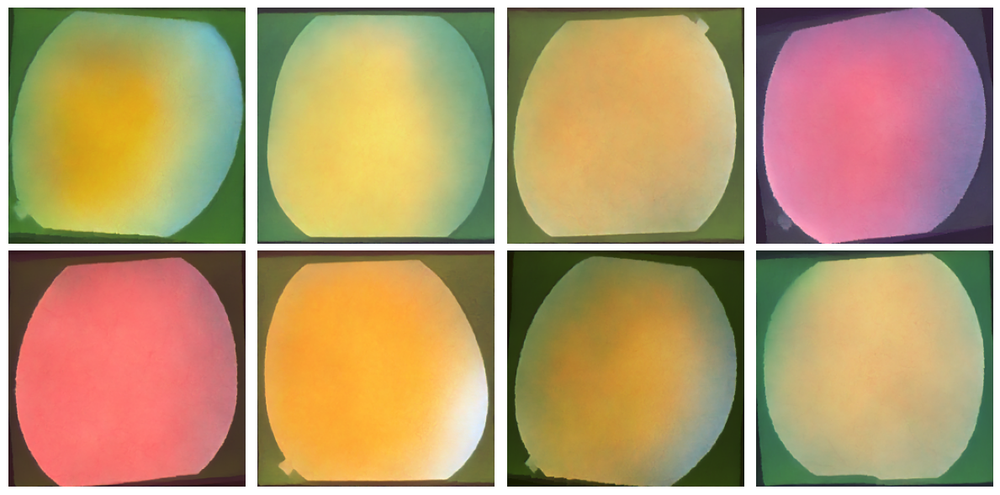

tensor(0., device='cuda:0') tensor(255., device='cuda:0')
[aug_model80] Epoch 71 | FID: 470.3965 | KID: 0.5935 | SSIM: 0.3786 | PSNR: 2.7216 | LPIPS: 0.8028 | IS: 1.0000 | Diversity: 0.2166

Epoch 2/10


Training aug_model80: 100%|██████████| 1183/1183 [06:35<00:00,  2.99it/s]


[aug_model80] Epoch 2, Loss: 0.0054


Sampling: 1000it [12:45,  1.31it/s]


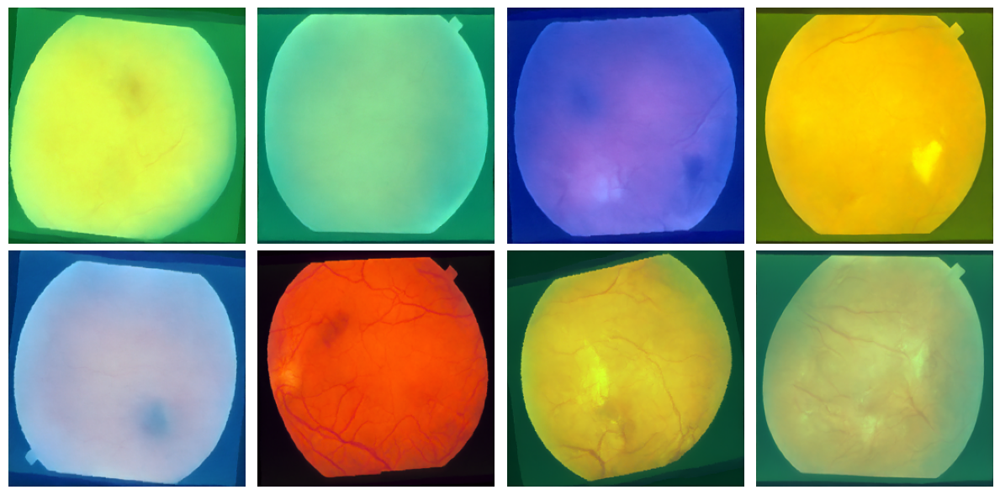

tensor(0., device='cuda:0') tensor(255., device='cuda:0')
[aug_model80] Epoch 72 | FID: 407.3855 | KID: 0.3283 | SSIM: 0.3735 | PSNR: 2.7610 | LPIPS: 0.8532 | IS: 1.0000 | Diversity: 0.4163

Epoch 3/10


Training aug_model80: 100%|██████████| 1183/1183 [06:35<00:00,  2.99it/s]


[aug_model80] Epoch 3, Loss: 0.0067


Sampling: 1000it [12:44,  1.31it/s]


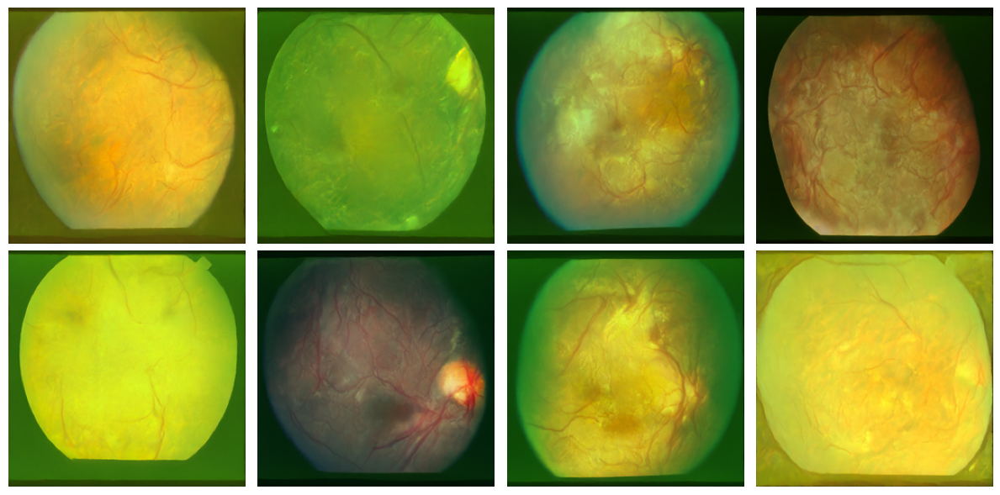

tensor(0., device='cuda:0') tensor(255., device='cuda:0')
[aug_model80] Epoch 73 | FID: 374.7475 | KID: 0.3097 | SSIM: 0.3766 | PSNR: 2.7452 | LPIPS: 0.8149 | IS: 1.0000 | Diversity: 0.2762

Epoch 4/10


Training aug_model80: 100%|██████████| 1183/1183 [06:35<00:00,  2.99it/s]


[aug_model80] Epoch 4, Loss: 0.0066


Sampling: 1000it [12:42,  1.31it/s]


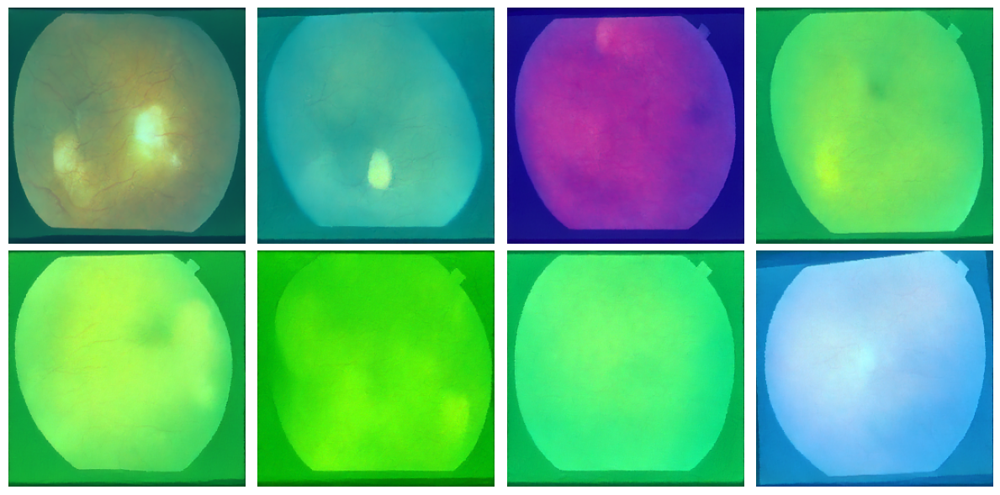

tensor(0., device='cuda:0') tensor(255., device='cuda:0')
[aug_model80] Epoch 74 | FID: 398.5883 | KID: 0.3392 | SSIM: 0.3761 | PSNR: 2.7371 | LPIPS: 1.0018 | IS: 1.0000 | Diversity: 0.3197

Epoch 5/10


Training aug_model80: 100%|██████████| 1183/1183 [06:35<00:00,  2.99it/s]


[aug_model80] Epoch 5, Loss: 0.0052


Sampling: 1000it [12:43,  1.31it/s]


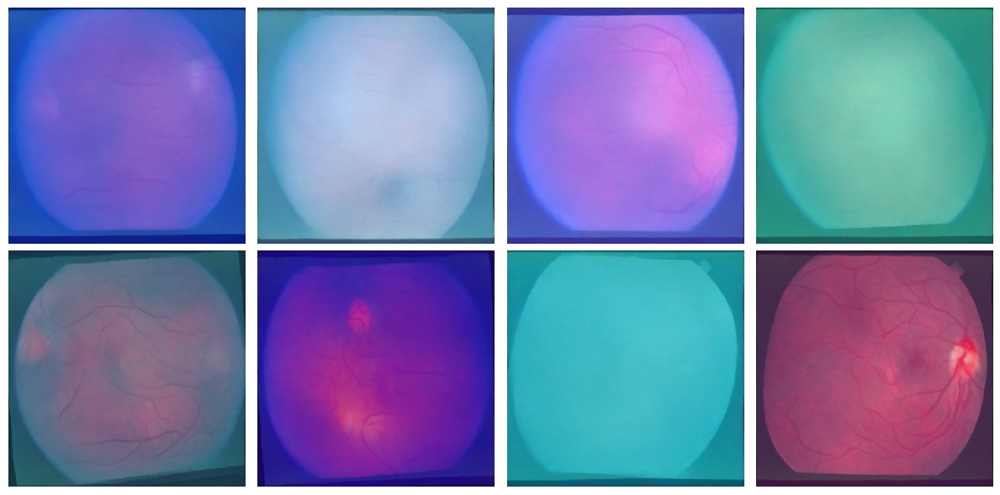

tensor(0., device='cuda:0') tensor(255., device='cuda:0')
[aug_model80] Epoch 75 | FID: 459.1442 | KID: 0.5634 | SSIM: 0.3785 | PSNR: 2.7218 | LPIPS: 1.0122 | IS: 1.0000 | Diversity: 0.3068

Epoch 6/10


Training aug_model80: 100%|██████████| 1183/1183 [06:36<00:00,  2.99it/s]


[aug_model80] Epoch 6, Loss: 0.0052


Sampling: 1000it [12:41,  1.31it/s]


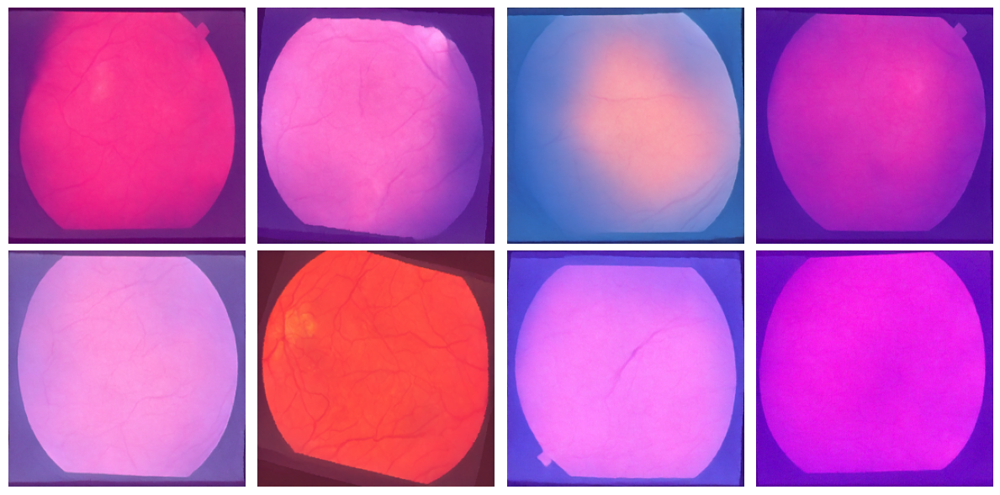

tensor(0., device='cuda:0') tensor(255., device='cuda:0')
[aug_model80] Epoch 76 | FID: 443.3905 | KID: 0.4689 | SSIM: 0.3782 | PSNR: 2.7251 | LPIPS: 0.9458 | IS: 1.0000 | Diversity: 0.2401

Epoch 7/10


Training aug_model80: 100%|██████████| 1183/1183 [06:36<00:00,  2.98it/s]


[aug_model80] Epoch 7, Loss: 0.0061


Sampling: 1000it [12:42,  1.31it/s]


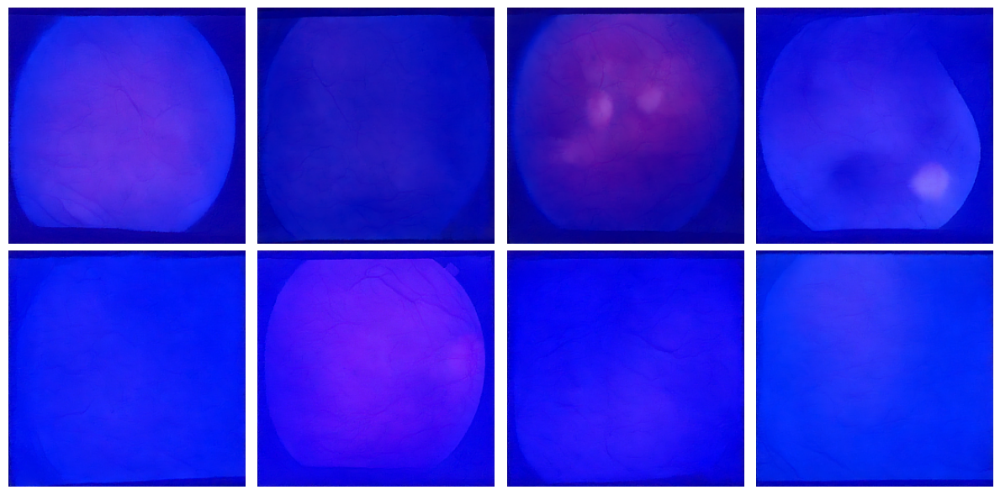

tensor(0., device='cuda:0') tensor(255., device='cuda:0')
[aug_model80] Epoch 77 | FID: 367.7198 | KID: 0.3552 | SSIM: 0.3607 | PSNR: 2.8186 | LPIPS: 1.0163 | IS: 1.0000 | Diversity: 0.1612

Epoch 8/10


Training aug_model80: 100%|██████████| 1183/1183 [06:38<00:00,  2.97it/s]


[aug_model80] Epoch 8, Loss: 0.0052


Sampling: 1000it [12:42,  1.31it/s]


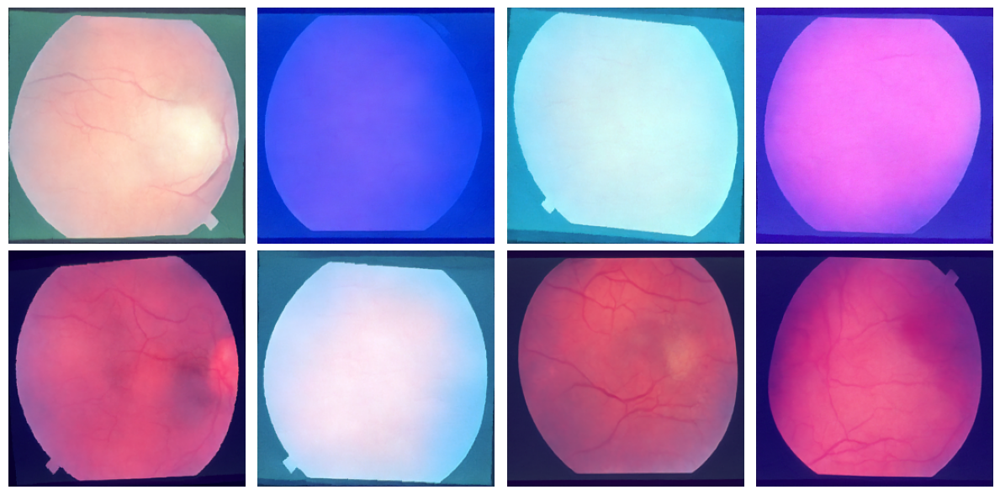

tensor(0., device='cuda:0') tensor(255., device='cuda:0')
[aug_model80] Epoch 78 | FID: 443.3356 | KID: 0.4381 | SSIM: 0.3775 | PSNR: 2.7370 | LPIPS: 0.9025 | IS: 1.0000 | Diversity: 0.3188

Epoch 9/10


Training aug_model80: 100%|██████████| 1183/1183 [06:36<00:00,  2.98it/s]


[aug_model80] Epoch 9, Loss: 0.0062


Sampling: 1000it [12:41,  1.31it/s]


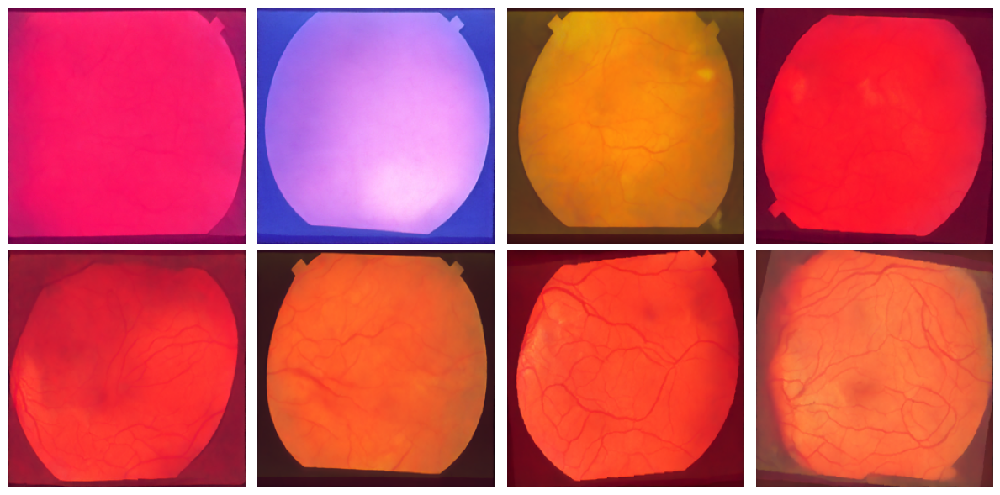

tensor(0., device='cuda:0') tensor(255., device='cuda:0')
[aug_model80] Epoch 79 | FID: 459.7169 | KID: 0.4858 | SSIM: 0.3782 | PSNR: 2.7250 | LPIPS: 0.8352 | IS: 1.0000 | Diversity: 0.2796

Epoch 10/10


Training aug_model80: 100%|██████████| 1183/1183 [06:36<00:00,  2.98it/s]


[aug_model80] Epoch 10, Loss: 0.0063


Sampling: 1000it [12:43,  1.31it/s]


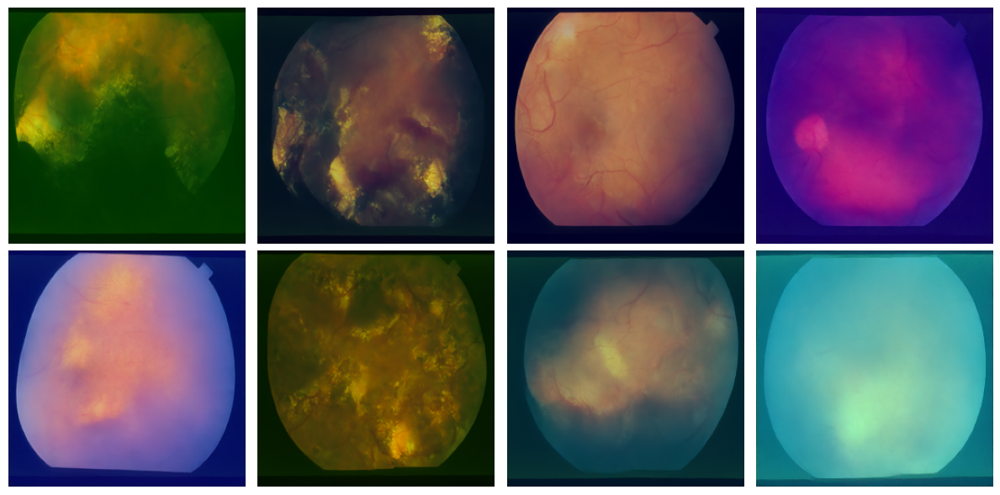

tensor(0., device='cuda:0') tensor(246., device='cuda:0')
[aug_model80] Epoch 80 | FID: 384.8900 | KID: 0.2665 | SSIM: 0.3685 | PSNR: 2.9123 | LPIPS: 0.8802 | IS: 1.0000 | Diversity: 0.4949


In [5]:
model, losses, fid_scores, kid_scores, ssim_scores, psnr_scores, lpips_scores, inception_scores, diversity_scores = train_diffusion_model(
    data_path="/kaggle/working/stare_prepared/augmented",
    model_name="aug_model80",
    epochs=10, 
    batch_size=1,
    resume_from = "/kaggle/input/aug_model_70_80/pytorch/default/1/aug_model70_final_weights.pth"
) 


In [6]:
import json

metrics = {
    "losses": losses,
    "fid_scores": fid_scores,
    "kid_scores": kid_scores,
    "ssim_scores": ssim_scores,
    "psnr_scores": psnr_scores,
    "lpips_scores": lpips_scores,
    "inception_scores": inception_scores,
    "diversity_scores": diversity_scores,
}

with open(f"/kaggle/working/aug_model_80_100_metrics.json", "w") as f:
    json.dump(metrics, f)


In [ ]:
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision.transforms import Compose, Resize, ToTensor, Normalize, Lambda
from torchvision.models.feature_extraction import get_graph_node_names
from torchvision.models import inception_v3
from torchvision.transforms.functional import resize
from PIL import Image
import os
from torchmetrics.image.fid import FrechetInceptionDistance
from torchmetrics.image.inception import InceptionScore

class FlatImageDataset(Dataset):
    def __init__(self, folder_path, transform=None):
        self.image_files = [
            os.path.join(folder_path, f)
            for f in os.listdir(folder_path)
            if f.lower().endswith((".png", ".jpg", ".jpeg"))
        ]
        self.transform = transform

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img = Image.open(self.image_files[idx]).convert("RGB")
        return self.transform(img) if self.transform else img

def generate_fake_images(model, scheduler, num_images=4):
    # Simulate image generation from model (you should replace this logic)
    return torch.randn(num_images, 3, 256, 256)

def compute_fid_and_inception(model, noise_scheduler, real_data_path, num_samples=100):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    transform = Compose([
        Resize((299, 299)),
        ToTensor(),
        Lambda(lambda x: (x * 255).byte())  # Convert to uint8
    ])

    real_dataset = FlatImageDataset(real_data_path, transform=transform)
    real_loader = DataLoader(real_dataset, batch_size=1, shuffle=True)

    fid = FrechetInceptionDistance(feature=2048).to(device)
    iscore = InceptionScore().to(device)

    total_real = 0
    total_fake = 0
    batch_size = 4  # You can adjust this

    real_iter = iter(real_loader)

    while total_real < num_samples:
        try:
            real_batch = next(real_iter)
        except StopIteration:
            break

        b = real_batch.size(0)
        real_batch = real_batch.to(device)
        fid.update(real_batch, real=True)
        total_real += b

        # Generate fake images using your function
        fake_batch = generate_samples(model, noise_scheduler, num_images=b, return_tensor=True)

        fake_batch = fake_batch.to(device)
        fake_batch = fake_batch.float() / 255.0  # Normalize to [0, 1]
        fake_batch = torch.nn.functional.interpolate(fake_batch, size=(299, 299), mode="bilinear")  # Resize
        fake_batch = (fake_batch * 255).to(torch.uint8)  # Back to uint8

        fid.update(fake_batch, real=False)
        iscore.update(fake_batch)
        total_fake += b

    fid_score = fid.compute()
    is_mean, is_std = iscore.compute()

    print(f"\nFID Score: {fid_score.item():.4f}")
    print(f"Inception Score: {is_mean.item():.4f} ± {is_std.item():.4f}")



In [ ]:
compute_fid_and_inception(
    model=model,
    noise_scheduler=DDPMScheduler(num_train_timesteps=1000),
    real_data_path="/kaggle/working/stare_prepared/augmented",  # Your training dataset directory
    num_samples=7  # Increase for more accurate scores
)


In [ ]:
import os
os.listdir("/kaggle/working/")

In [ ]:
os.getcwd()

In [ ]:
from IPython.display import FileLink
FileLink(r'aug_model30_fid.png')